In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import copy
import os
import torch
from PIL import Image, ImageDraw
from torch.utils.data import Dataset, random_split
from torchvision import utils
import torchvision.transforms as transforms
import torch.nn as nn
%matplotlib inline


In [2]:
!pip install torchsummary

In [3]:
import cv2 as cv

## Load Dataset

In [4]:
labels_df=pd.read_csv('/kaggle/input/histopathologic-cancer-detection/train_labels.csv')
print(labels_df.head().to_markdown())


|    | id                                       |   label |
|---:|:-----------------------------------------|--------:|
|  0 | f38a6374c348f90b587e046aac6079959adf3835 |       0 |
|  1 | c18f2d887b7ae4f6742ee445113fa1aef383ed77 |       1 |
|  2 | 755db6279dae599ebb4d39a9123cce439965282d |       0 |
|  3 | bc3f0c64fb968ff4a8bd33af6971ecae77c75e08 |       0 |
|  4 | 068aba587a4950175d04c680d38943fd488d6a9d |       0 |


In [5]:
os.listdir('/kaggle/input/histopathologic-cancer-detection')

['sample_submission.csv', 'train_labels.csv', 'test', 'train']

In [6]:
labels_df.shape

(220025, 2)

In [7]:
labels_df[labels_df.duplicated(keep=False)]

,id,label


In [8]:
labels_df['label'].value_counts()

label
0    130908
1     89117
Name: count, dtype: int64

In [9]:
imgpath="/kaggle/input/histopathologic-cancer-detection/train"
malignant=labels_df.loc[labels_df['label']==1]['id'].values
normal=labels_df.loc[labels_df['label']==0]['id'].values

print(f"Normal ids: \n{normal[:3]}\n\nMalignant ids: \n{malignant[:3]}")

Normal ids: 
['f38a6374c348f90b587e046aac6079959adf3835'
 '755db6279dae599ebb4d39a9123cce439965282d'
 'bc3f0c64fb968ff4a8bd33af6971ecae77c75e08']

Malignant ids: 
['c18f2d887b7ae4f6742ee445113fa1aef383ed77'
 'a24ce148f6ffa7ef8eefb4efb12ebffe8dd700da'
 '7f6ccae485af121e0b6ee733022e226ee6b0c65f']


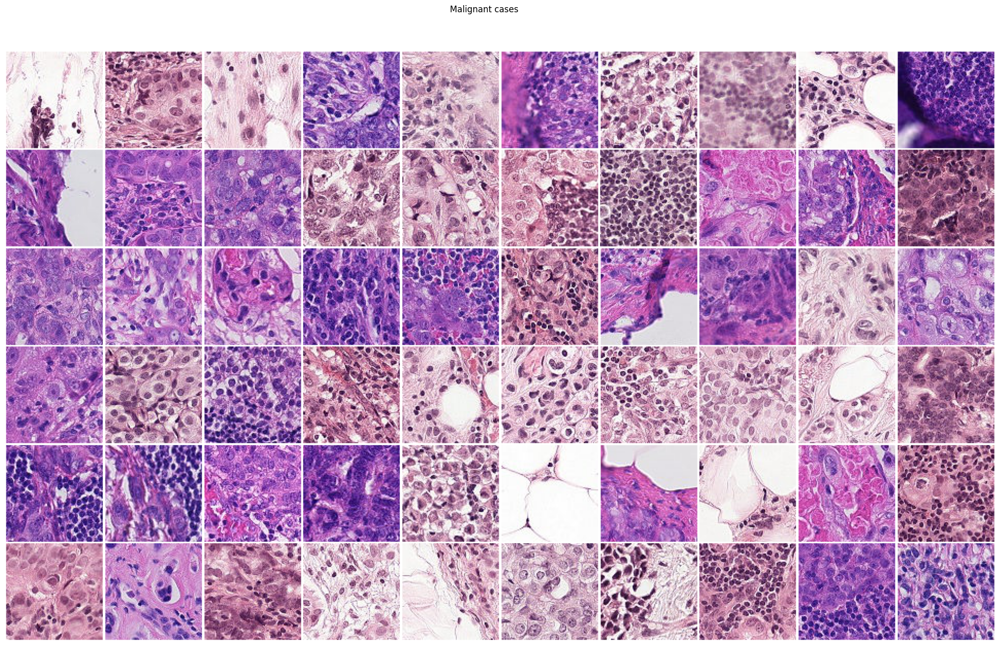

In [10]:
def plot_fig(ids,title,n_rows=6,n_cols=10, figsize=(25,15)):
    fig,ax=plt.subplots(n_rows,n_cols,figsize=figsize)
    plt.subplots_adjust(wspace=0,hspace=0)
    for i,j in enumerate(ids[:n_rows*n_cols]):
        fname=os.path.join(imgpath,j+'.tif')
        img=Image.open(fname)
        idcol=ImageDraw.Draw(img)
        idcol.rectangle(((0,0),(95,95)),outline='white')
        plt.subplot(n_rows,n_cols,i+1)
        plt.imshow(np.array(img))
        plt.axis('off')
    plt.suptitle(title,y=0.94)
    
plot_fig(malignant,'Malignant cases')

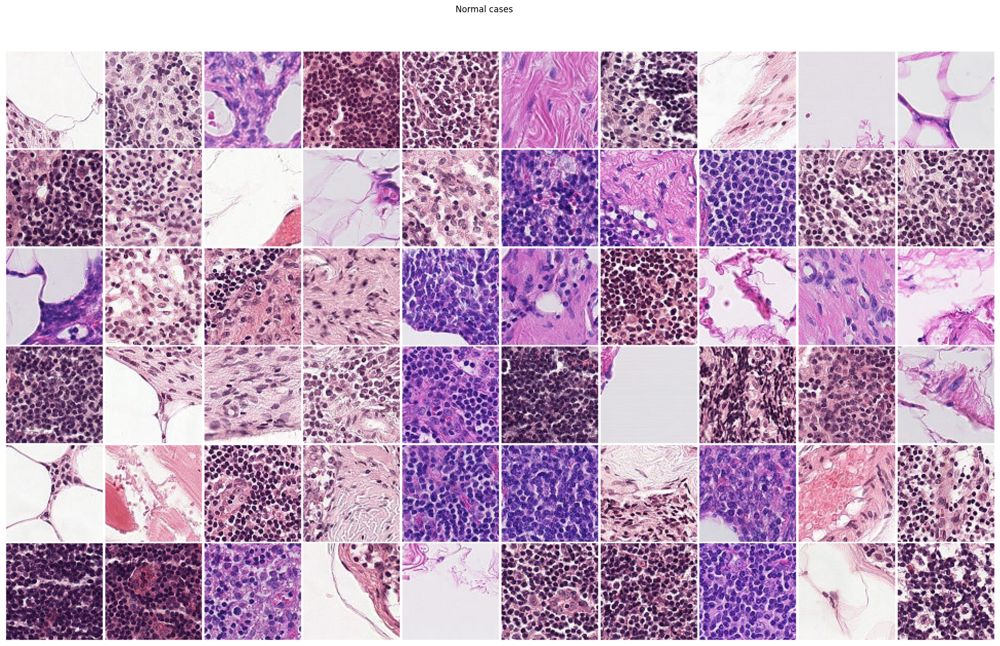

In [11]:
plot_fig(normal,'Normal cases')

## Data Preperation

In [13]:
torch.manual_seed(0)
class pytorch_data:
    def __init__(self,data_dir,transform,data_type='train'):
        
        # Get image file names
        cdm_data=os.path.join(data_dir,data_type)
        file_names=os.listdir(cdm_data)
        idx_choose=np.random.choice(np.arange(len(file_names)),4000,replace=Falsee).tolist()
        file_names_sample=[file_names[x] for x in range()]
        self.full_filenames=[os.path.join(cdm_data,f) for f in file_name_sample] # list of 4000 images with abs path
        
        # get labels
        labels_data_path=os.path.join(data_dir,"train_labels.csv")
        labels_df=pd.read_csv(labels_data_path)
        labels_df.set_index('id',inplace=True)
        self.labels=[labels_df.loc[filename[:-4]].values[0] for filename in file_names_sample]
        self.transform=transform
        
    def __len__(self):
        return len(self.full_filenames)
    
    def __getitem__(self,idx):
        # open image, apply transformation and return  with label
        image=Image.open(self.full_filenames[idx])
        image=self.transform(image)
        return image, self.labels[idx]